In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import torch as t
import torch.nn as nn
import pytorch_lightning as pl
import pandas as pd
import librosa
import librosa.display
from tqdm import tqdm
from collections import defaultdict
from sklearn.model_selection import train_test_split
from torchaudio.transforms import TimeMasking, FrequencyMasking
from torchvision.transforms import Compose, RandomApply
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
from src.data.dataset import BirdMelTrainDataset, EBIRD_CODE_TO_INDEX, INDEX_TO_EBIRD_CODE
from src.data.transforms import RandomTimeResize, RandomTimeShift

In [5]:
df = pd.read_csv('../data/raw/birdsong-recognition/train.csv')
df = df[df['filename'] != 'XC313679.mp3']
df = df[df['duration'] < 120]
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['ebird_code'])
train_dataset = BirdMelTrainDataset(
    train_df,
    '../data/processed/mel_specs_train/',
    False,
    Compose([
        RandomApply([RandomTimeShift()], 0.5),
        RandomApply([RandomTimeResize(resize_mode='bilinear')], 0.5),
        TimeMasking(10),
        FrequencyMasking(8),
    ])
)

test_dataset = BirdMelTrainDataset(
    test_df,
    '../data/processed/mel_specs_train/',
    False
)

In [6]:
def plot_data(mel_spec, ax):
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    librosa.display.specshow(mel_spec_db, sr=44100, hop_length=512, x_axis='time', y_axis='mel', ax=ax);

In [140]:
random_birds = np.random.choice(INDEX_TO_EBIRD_CODE, 30, replace=False)

In [141]:
random_birds

array(['easmea', 'warvir', 'stejay', 'chswar', 'nutwoo', 'greyel',
       'bkbcuc', 'easkin', 'rudduc', 'blkpho', 'yelwar', 'wilsni1',
       'plsvir', 'phaino', 'pilwoo', 'amtspa', 'yerwar', 'snogoo',
       'wessan', 'eursta', 'magwar', 'vigswa', 'ruckin', 'lotduc',
       'comnig', 'norsho', 'coohaw', 'easpho', 'spotow', 'bktspa'],
      dtype='<U7')

In [142]:
# random_birds = ['hoowar', 'pibgre', 'wessan', 'norhar2', 'brwhaw', 'pinsis',
#        'amerob', 'chiswi', 'lobcur', 'rethaw', 'yebsap', 'sheowl',
#        'whfibi', 'chispa', 'bongul', 'buggna', 'solsan', 'lesyel',
#        'gocspa', 'comgra', 'bkbwar', 'pecsan', 'easblu', 'norfli',
#        'ribgul', 'coohaw', 'bkpwar', 'amewig', 'louwat', 'robgro']

In [143]:
def remove_noise(spec):
    spec = spec.clone()
    spec[spec < t.mean(spec)] = 0.00001
    

In [10]:
bird_samples = defaultdict(list)
for ebird_code in random_birds:
    bird_df = df[df['ebird_code'] == ebird_code]
    bird_df = bird_df[bird_df['duration'] < 10]
    dataset = BirdMelTrainDataset(
        bird_df,
        '../data/processed/mel_specs_train/',
        True
    )
    for i in range(5):
        bird_samples[ebird_code].append(dataset[i])


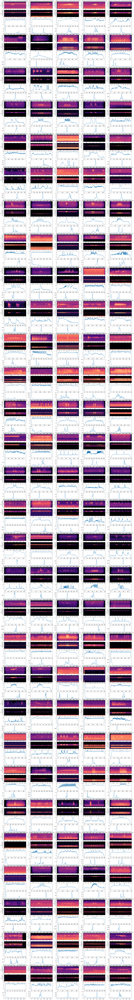

In [121]:
fig, axes = plt.subplots(120, 5, figsize=(30, 240))
i = 0
for code, samples in bird_samples.items():
    for sample in samples:
        plot_data(sample['mel_spec'], axes.flat[i])
        axes.flat[i].set_title(str(sample['filepath']))
        spec = sample['mel_spec'].clone()
        spec_std = t.std(sample['mel_spec'], dim=1)
        # spec[spec < t.mean(spec)] = 0.00001
        spec[spec_std < t.mean(spec_std), :] = 0.00001
        plot_data(spec, axes.flat[i+5])
        axes.flat[i+10].plot(t.log(t.sum(spec, dim=0)))
        axes.flat[i+15].plot(t.std(sample['mel_spec'], dim=1))
        i += 1
    i += 15

In [123]:
df[df['filename'] == 'XC372592.mp3']

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,...,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license
10375,4.0,yes,hoowar,2 (stereo),2017-05-20,Not specified,2,XC372592.mp3,accelerating,Hooded Warbler,...,372592,https://www.xeno-canto.org/372592,United States,Dean Shoup,Setophaga citrina_Hooded Warbler,-105.1191,0-3(s),11:00,Dean Shoup,Creative Commons Attribution-NonCommercial-Sha...


In [73]:
df = pd.read_csv('../data/raw/birdsong-recognition/train.csv')
df = df[df['filename'] != 'XC313679.mp3']
train_dataset = BirdMelTrainDataset(
    df,
    '../data/processed/mel_specs_train/',
    False,
    Compose([
        RandomApply([RandomTimeShift(1.0)], 0.5),
        RandomApply([RandomTimeResize(resize_mode='bilinear')], 0.5),
        TimeMasking(10),
        FrequencyMasking(8),
    ])
)

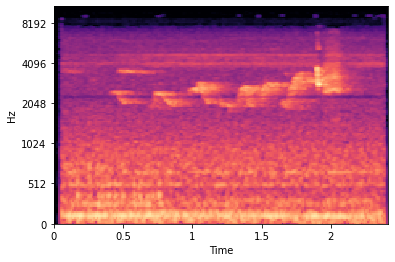

In [128]:
plot_data(train_dataset[10374]['mel_spec'], plt.gca())

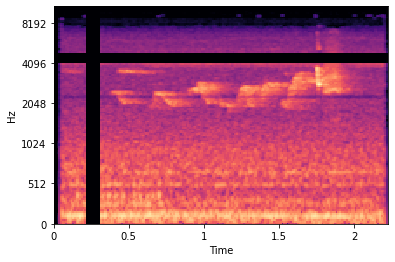

In [204]:
plot_data(train_dataset[10374]['mel_spec'], plt.gca())

In [242]:
def windowed_std(mel_spec, w):
    w_0 = w[0]
    w_1 = w[1]
    max_0 = mel_spec.size(0) - w_0
    max_1 = mel_spec.size(1) - w_1
    
    result = np.zeros((max_0, max_1))
    for i in range(max_0):
        for j in range(max_1):
            result[i][j] = t.std(mel_spec[i:i+w_0, j:j+w_1]).item()
    return result
    
    

In [284]:
def plot_a_bunch(sample, w_size=(32, 128)):
    fig, axis = plt.subplots(5, 1, figsize=(10, 15))
    i = 0
    mel_spec = sample['mel_spec']
    plot_data(mel_spec, axis.flat[0])
    axes.flat[0].set_title(str(sample['rating']))

    # spec[spec < t.mean(spec)] = 0.00001
    wstds = windowed_std(mel_spec, w_size)
    axis.flat[1].imshow(wstds, cmap='gray', aspect='auto', interpolation='nearest')

    spec = mel_spec.clone()
    spec_std = t.std(mel_spec, dim=1)
    spec[spec_std < t.mean(spec_std), :] = 0.00001
    
    plot_data(spec, axis.flat[2])
    
    axis.flat[3].plot(t.log(t.sum(spec, dim=0)))
    axis.flat[4].plot(t.std(mel_spec, dim=1))

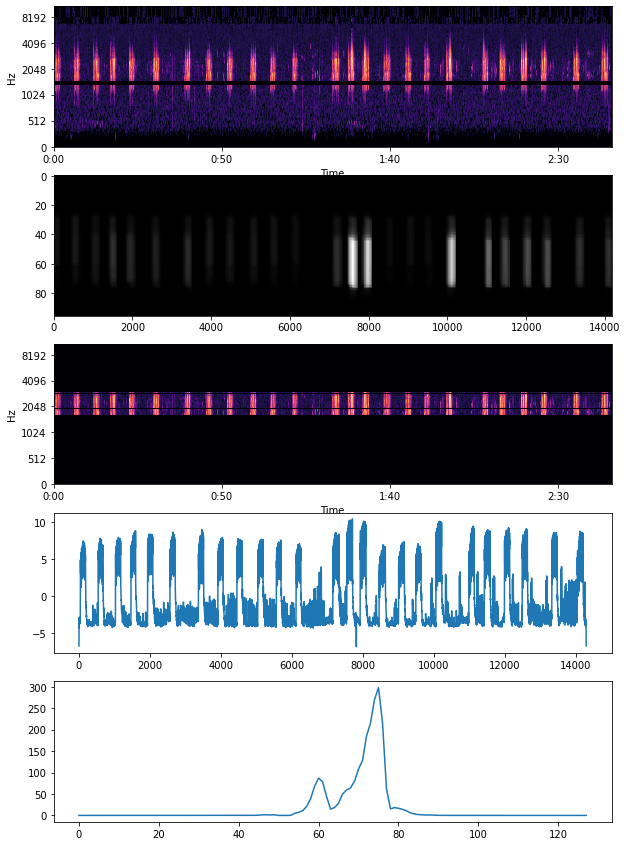

In [285]:
plot_a_bunch(train_dataset[11000])

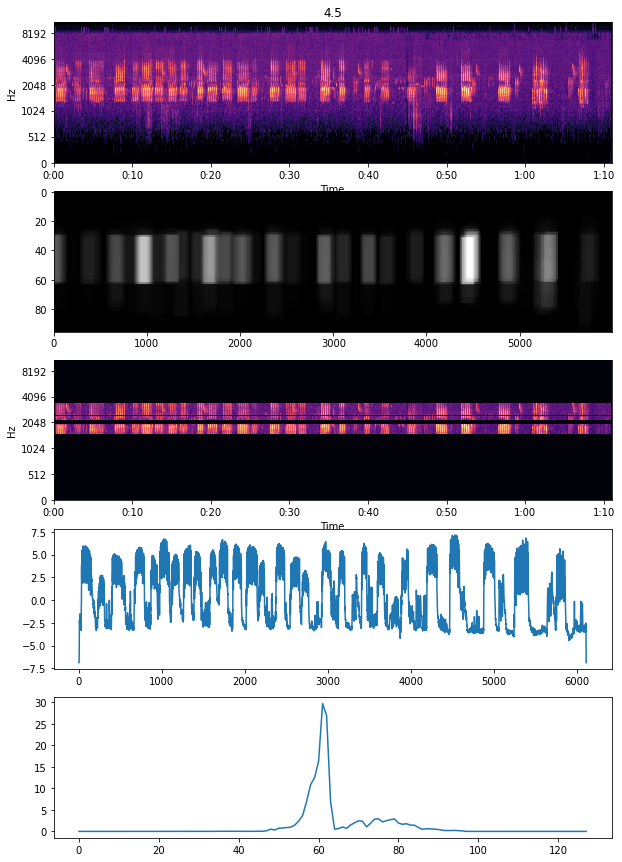

In [118]:
plot_a_bunch(train_dataset[11010])

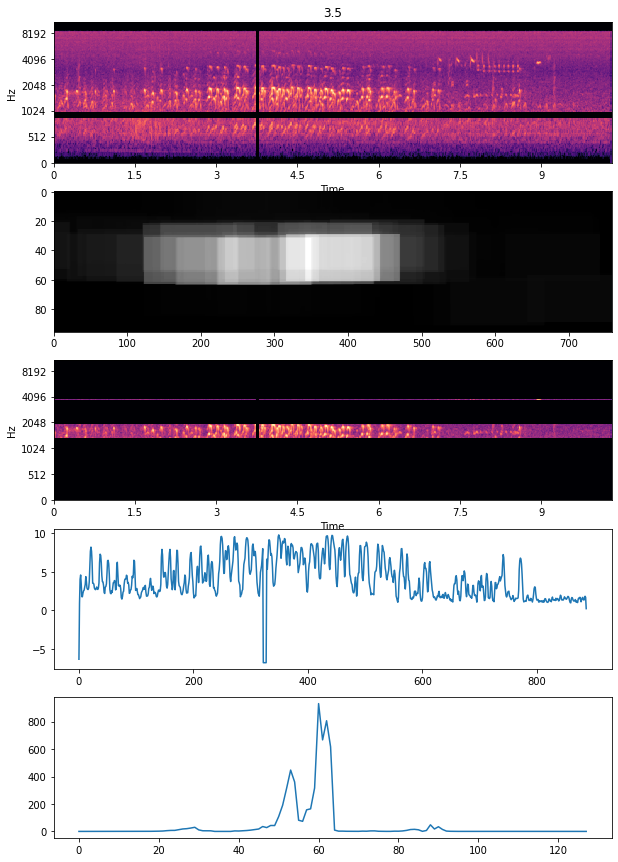

In [245]:
plot_a_bunch(train_dataset[100])

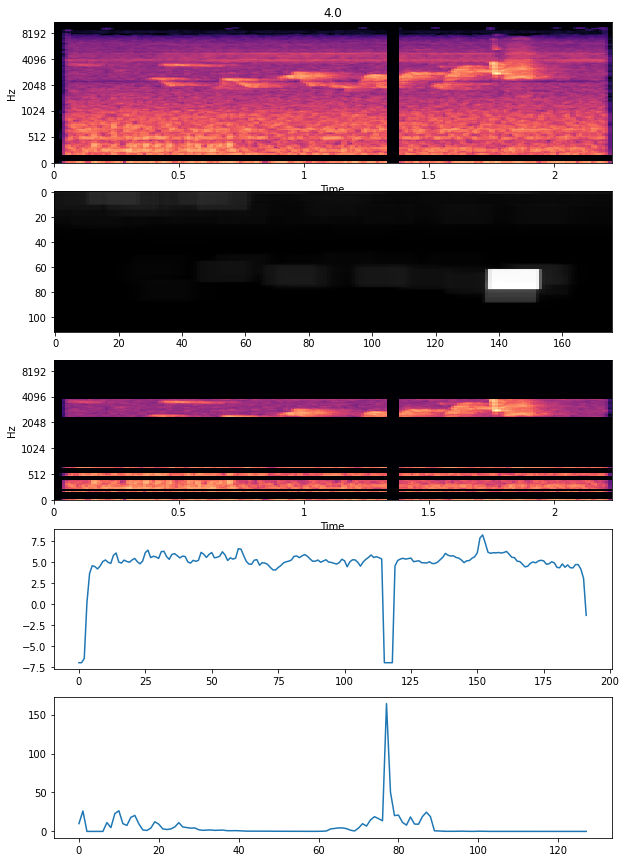

In [246]:
plot_a_bunch(train_dataset[10374], (16, 16))

In [300]:
def detect_nocall(mel_spec):
    time_energy = t.sum(mel_spec, dim=0)
    nocall = time_energy < np.quantile(time_energy, 0.5)
    return nocall

In [301]:
def plot_call_nocall(mel_spec):
    fig, axis = plt.subplots(2, 1, figsize=(10, 5))
    spec = mel_spec.clone()
    nocall = detect_nocall(spec)
    plot_data(spec, axis.flat[0])
    spec[:, nocall] = 0.00001
    plot_data(spec, axis.flat[1])

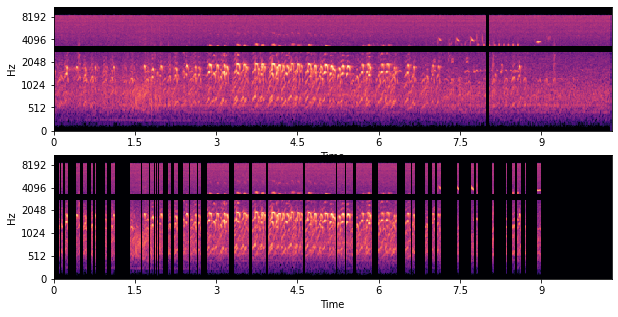

In [302]:
plot_call_nocall(train_dataset[100]['mel_spec'])

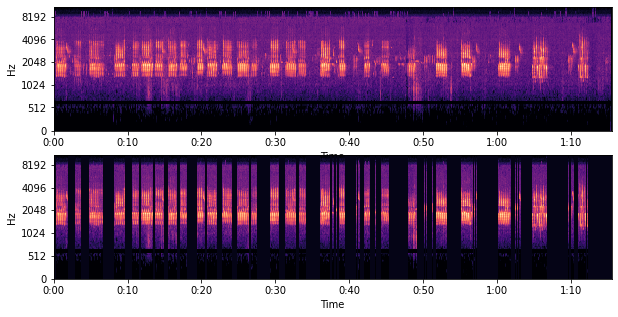

In [308]:
plot_call_nocall(train_dataset[11010]['mel_spec'])